In [76]:
import sys
sys.path.append("../..")

In [77]:
#model checkpoint directory
model_path = 'C:/Users/david/Documents/progetto/SIV/trained_models/simclr_18_ski'
backbone = 'resnet18'
#dataset name to use
dataset = 'skiPose'

# Imports

In [78]:
import os
import torch
import re
import random
from torchvision.io import read_image

import matplotlib.pyplot as plt
import torchvision.transforms as T

from torch import nn

## SimCLR method
[SimCLR](https://arxiv.org/pdf/2002.05709.pdf) I take the base encoder model (ResNet50) and replace its fully connected layer with a projection head.

In [79]:
from contrastive_training.simclr.model import get_simclr_net

# Clustering

I extract the representations from the trained model and run K means clustering algorithm (number of clusters=8) on these representation. I reduce the dimentionality of the representations with PCA and LDA algorithm and plot the clustering.
For the comparison I use the representations extracted from encoder model (before the projection head) and the representations extracted after the projection head.

## Setup

In [80]:
from dataloaders.datasets import pose_datasets as data

In [81]:
device = 'cpu'
if torch.cuda.is_available():
    device = 'cuda'

In [82]:
def get_cluster_data(batch_size, dataset='panoptic', indexes=[2]):
    transforms = T.Compose(
        [
            T.ToTensor(),
            T.Resize(size=(128, 128)),
        ]
    )

    cluster_dataset = data[dataset](transforms, dataset_dir='../../datasets')
    
    if len(indexes) == 1:
        cluster_loader = torch.utils.data.DataLoader(cluster_dataset[2], batch_size)
    else:
        datasets = []
        loaders = []
        for i in indexes:
            datasets.append(cluster_dataset[i])
            loaders.append(torch.utils.data.DataLoader(datasets[-1], batch_size))
        cluster_loader = loaders
        cluster_dataset = datasets

    return cluster_dataset, cluster_loader

In [83]:
from tqdm.auto import tqdm
def extract_representations(path, cluster_loader, load=True):
    net = get_simclr_net(backbone)

    if load:
        net.load_state_dict(torch.load(path))

    net.to(device)
    net.eval()

    proj_repr = []
    base_repr = []
    poses = []

    with torch.no_grad():
        for inputs in tqdm(cluster_loader):
            images = inputs['image']
            images.to(device)
            base, proj = net(images)
            proj_repr.append(proj)
            base_repr.append(base)
            poses.append(inputs['poses_3d'])

    return torch.cat(base_repr).cpu().numpy(), torch.cat(proj_repr).cpu().numpy(), torch.cat(poses).cpu().numpy()

In [84]:
from sklearn.cluster import KMeans


def kmeans_algorithm(features, n_clusters=8, random_state=0):
    kmeans = KMeans(n_clusters=n_clusters, random_state=random_state)
    kmeans.fit(features)

    return kmeans.labels_

In [85]:
#import LDA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
#import PCA
from sklearn.decomposition import PCA

def reduce_dim_LDA(features, labels, n_components=2):
    lda = LDA(n_components=n_components)
    lda.fit(features, labels)

    return lda.transform(features)

def reduce_dim_PCA(features, n_components=2):
    pca = PCA(n_components=n_components)
    pca.fit(features)

    return pca.transform(features)

In [86]:
def plot_clusters(clusters, features, title):
    colors = plt.cm.get_cmap('tab20', len(set(clusters)))
    cluster_colors = [colors(c) for c in clusters]

    plt.scatter(features[:, 0], features[:, 1], c=cluster_colors)
    plt.title(title)
    plt.show()

In [87]:
import numpy as np
from scipy.spatial import procrustes
# ---------------------- Custom Distance and Silhouette Functions ----------------------

def pose_distance(pose1, pose2, align=False):
    """
    Computes the distance between two poses.
    
    Parameters:
    - pose1, pose2: Arrays of shape (n_joints, 3)
    - align: If True, aligns the poses before computing distance using Procrustes analysis
    
    Returns:
    - Mean Euclidean distance between corresponding joints
    """
    if align:
        # Align poses using Procrustes analysis to account for translation, rotation, and scaling
        mtx1, mtx2, disparity = procrustes(pose1, pose2)
        return np.mean(np.linalg.norm(mtx1 - mtx2, axis=1))
    else:
        return np.mean(np.linalg.norm(pose1 - pose2, axis=1))

def compute_distance_matrix(poses, align=False):
    """
    Computes the pairwise distance matrix for a set of poses.
    
    Parameters:
    - poses: Array of shape (n_samples, n_joints, 3)
    - align: If True, aligns each pair of poses before computing distance
    
    Returns:
    - distance_matrix: Array of shape (n_samples, n_samples)
    """
    n_samples = poses.shape[0]
    distance_matrix = np.zeros((n_samples, n_samples))
    
    for i in range(n_samples):
        for j in range(i + 1, n_samples):
            distance = pose_distance(poses[i], poses[j], align=align)
            distance_matrix[i, j] = distance
            distance_matrix[j, i] = distance  # Symmetric matrix
    
    return distance_matrix

def custom_silhouette_score(poses, labels, align=False):
    """
    Computes a custom silhouette score based on pose similarity.
    
    Parameters:
    - poses: Array of shape (n_samples, n_joints, 3)
    - labels: Array of cluster labels for each sample
    - align: If True, aligns poses before computing distances
    
    Returns:
    - mean_silhouette: The mean silhouette score
    """
    n_samples = poses.shape[0]
    unique_labels = np.unique(labels)
    n_labels = unique_labels.shape[0]
    
    # Compute the distance matrix
    print("Computing pairwise distance matrix for poses...")
    distance_matrix = compute_distance_matrix(poses, align=align)
    
    silhouette_vals = np.zeros(n_samples)
    
    for i in range(n_samples):
        label_i = labels[i]
        
        # Indices of all samples in the same cluster, excluding the current sample
        same_cluster = (labels == label_i)
        same_cluster[i] = False  # Exclude self
        
        if np.sum(same_cluster) == 0:
            a = 0  # Define a as 0 if the sample is the only one in its cluster
        else:
            a = np.mean(distance_matrix[i][same_cluster])
        
        # Compute the average distance to the nearest cluster
        b = np.inf
        for label in unique_labels:
            if label == label_i:
                continue
            other_cluster = (labels == label)
            if np.sum(other_cluster) == 0:
                continue
            distance_to_cluster = np.mean(distance_matrix[i][other_cluster])
            if distance_to_cluster < b:
                b = distance_to_cluster
        
        silhouette_vals[i] = (b - a) / max(a, b) if max(a, b) > 0 else 0
    
    mean_silhouette = np.mean(silhouette_vals)
    return mean_silhouette

In [88]:
from sklearn.metrics import silhouette_score
from scipy.stats import spearmanr



def cluster(model_path, load=True, n_clusters=8, n_components=2, dataset='panoptic', random_state=0):
    cluster_set, cluster_loader = get_cluster_data(30, dataset)

    base_features, proj_features, poses = extract_representations(model_path, cluster_loader, load)

    labels_base = kmeans_algorithm(features=base_features, n_clusters=n_clusters, random_state=random_state)
    lda_base = reduce_dim_LDA(features=base_features, labels=labels_base, n_components=n_components)
    pca_base = reduce_dim_PCA(features=base_features, n_components=n_components)

    labels_proj = kmeans_algorithm(proj_features, n_clusters=n_clusters, random_state=random_state)
    lda_proj = reduce_dim_LDA(features=proj_features, labels=labels_proj, n_components=n_components)
    pca_proj = reduce_dim_PCA(features=proj_features, n_components=n_components)

    silhouette_base = silhouette_score(base_features, labels_base)
    silhouette_proj = silhouette_score(proj_features, labels_proj)
    shilouette_poses_base = custom_silhouette_score(poses, labels_base)
    shilouette_poses_proj = custom_silhouette_score(poses, labels_proj)

    pose_distances = compute_distance_matrix(poses, align=True).flatten()
    # embedding_distances using cosine similarity
    embedding_distances = - np.dot(base_features, base_features.T) / np.linalg.norm(base_features, axis=1) / np.linalg.norm(base_features, axis=1)
    embedding_distances = embedding_distances.flatten()
    correlation, _ = spearmanr(pose_distances, embedding_distances)
    print("Spearman correlation between pose distances and embedding distances on encoder: {}".format(correlation))
    
    embedding_distances = - np.dot(proj_features, proj_features.T) / np.linalg.norm(proj_features, axis=1) / np.linalg.norm(proj_features, axis=1)
    embedding_distances = embedding_distances.flatten()
    correlation, _ = spearmanr(pose_distances, embedding_distances)
    print("Spearman correlation between pose distances and embedding distances on projection: {}".format(correlation))

    print("Silhouette score for the encoder features: {}".format(silhouette_base))
    print("Silhouette score for the projection head features: {}".format(silhouette_proj))
    print("Silhouette score for the poses with encoder features: {}".format(shilouette_poses_base))
    print("Silhouette score for the poses with projection head features: {}".format(shilouette_poses_proj))

    plot_clusters(labels_base, lda_base, "Encoder features LDA")
    plot_clusters(labels_proj, lda_proj, "Projection head features LDA")

    plot_clusters(labels_base, pca_base, "Encoder features PCA")
    plot_clusters(labels_proj, pca_proj, "Projection head features PCA")

    return cluster_set, base_features, proj_features, labels_base, labels_proj, lda_base, lda_proj, pca_base, pca_proj

In [89]:
#get the latest model
epoch = 0
for file in os.listdir(model_path):
    if 'epoch' in file:
        e = int(re.findall(r'\d+', file)[0])
        if e > epoch:
            epoch = e

path = model_path + '/epoch_{:d}.pt'.format(epoch)
print(path)

#path="trained_models/ver1.pt"

C:/Users/david/Documents/progetto/SIV/trained_models/simclr_18_ski/epoch_30.pt


## Before training

In [90]:
# _, _, _, _, _, _, _, _, _ = cluster(path, load=False, n_clusters=10, n_components=2, dataset=dataset, random_state=0)

## Trained model
visualization based on the model preprained with 0.0001 learning rate for base encoder

C:\Users\david\AppData\Local\Temp\ipykernel_14856\1405085076.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  net.load_state_dict(torch.load(path))


  0%|          | 0/58 [00:00<?, ?it/s]

Computing pairwise distance matrix for poses...
Computing pairwise distance matrix for poses...
Spearman correlation between pose distances and embedding distances on encoder: 0.09979174414093678
Spearman correlation between pose distances and embedding distances on projection: 0.16925691000531198
Silhouette score for the encoder features: 0.07391482591629028
Silhouette score for the projection head features: 0.13409696519374847
Silhouette score for the poses with encoder features: -0.011590474348736682
Silhouette score for the poses with projection head features: -0.05246459704139935


C:\Users\david\AppData\Local\Temp\ipykernel_14856\142177236.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab20', len(set(clusters)))


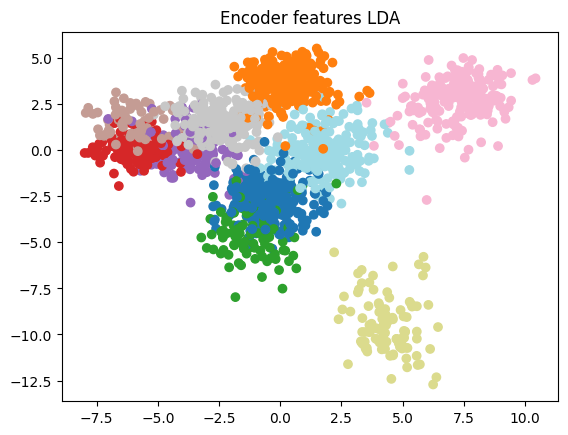

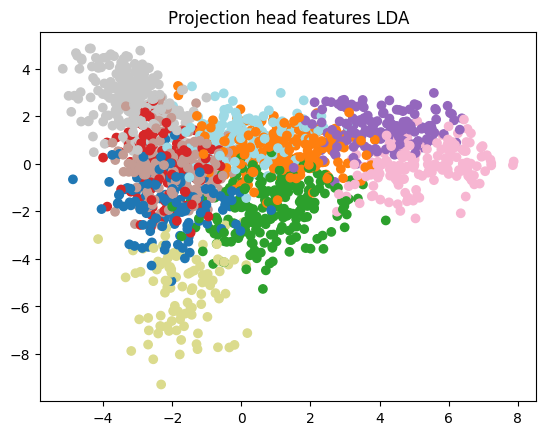

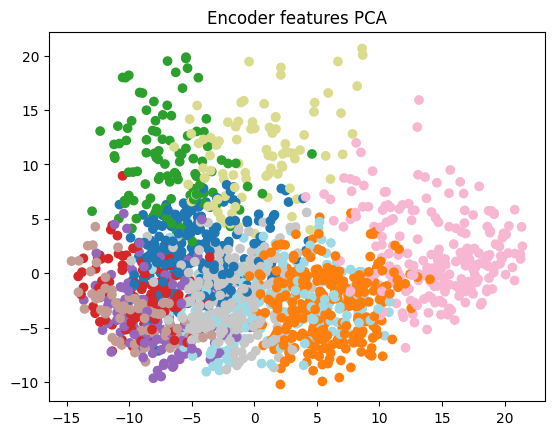

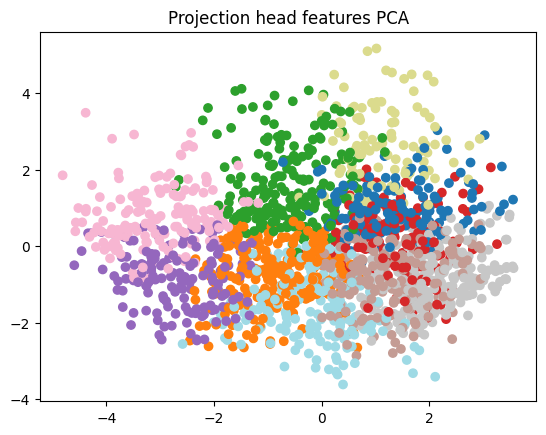

In [91]:
cluster_set, base_features, proj_features, labels_base, labels_proj, lda_base, lda_proj, pca_base, pca_proj = cluster(
    path, load=True, n_clusters=10, n_components=2, dataset=dataset, random_state=0
    )

C:\Users\david\AppData\Local\Temp\ipykernel_14856\1405085076.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  net.load_state_dict(torch.load(path))


  0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

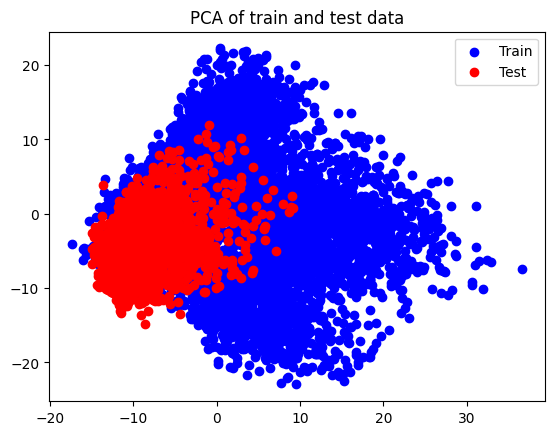

In [92]:
from sklearn.metrics import silhouette_score
from scipy.stats import spearmanr



def cluster_testandTrain(model_path, load=True, n_components=2, dataset='panoptic'):
    cluster_set, cluster_loader = get_cluster_data(30, dataset, [0,2])

    base_features_train, _, _ = extract_representations(model_path, cluster_loader[0], load)
    base_features_test, _, _ = extract_representations(model_path, cluster_loader[1], load)

    # show in the same plot the train and test data with different colors
    both_features = np.concatenate((base_features_train, base_features_test))
    pca_features = reduce_dim_PCA(both_features, n_components=n_components)
    pca_train = pca_features[:base_features_train.shape[0]]
    pca_test = pca_features[base_features_train.shape[0]:]

    plt.scatter(pca_train[:, 0], pca_train[:, 1], c='blue', label='Train')
    plt.scatter(pca_test[:, 0], pca_test[:, 1], c='red', label='Test')
    plt.legend()
    plt.title('PCA of train and test data')
    plt.show()

    return cluster_set, base_features_train, base_features_test

cluster_set, base_features_train, base_features_test = cluster_testandTrain( path, load=True, n_components=2, dataset=dataset)


### Clustering results

In [93]:
def plot_one_cluster(dataset, cluster_ind, labels):
    indexes = [i for i in range(0, len(labels)) if labels[i]==cluster_ind]

    plt.figure(figsize = (10,10))

    for i in range(0, 9):
        ax = plt.subplot(3, 3, i+1)
        ax.imshow(dataset[indexes[random.randint(0, len(indexes)-1)]]['image'].permute(1, 2, 0))

    plt.show()

#### Base encoder
Clustering based on features extracted from base encoder

IndexError: list index out of range

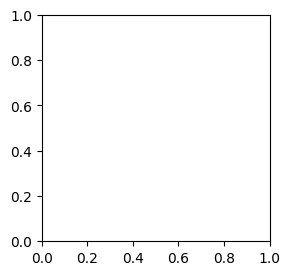

In [94]:
plot_one_cluster(cluster_set, 0, labels_base)

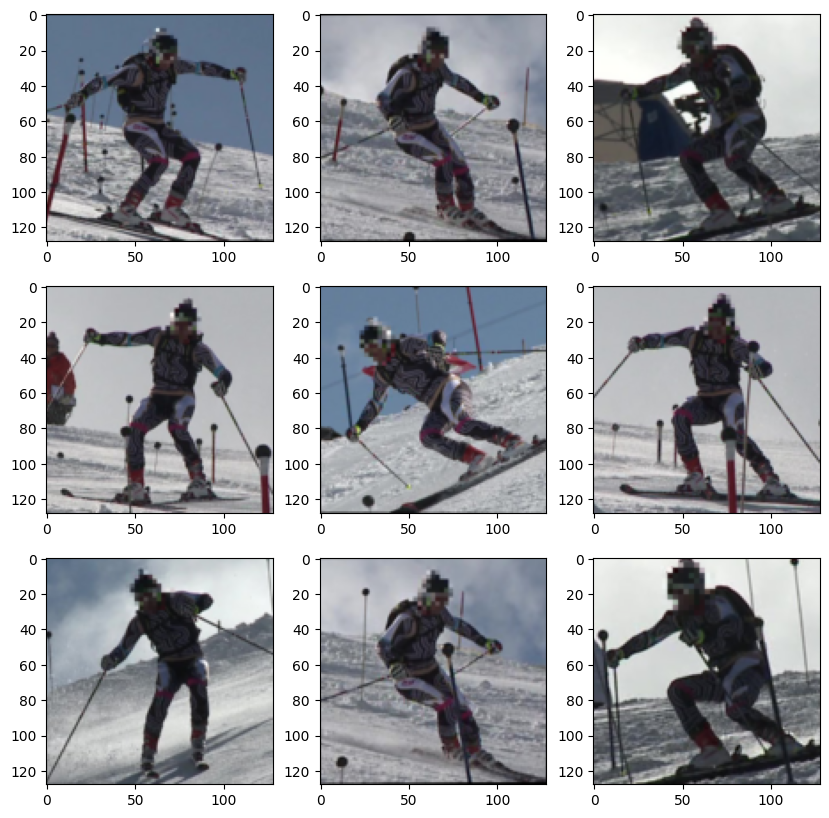

In [ ]:
plot_one_cluster(cluster_set, 1, labels_base)

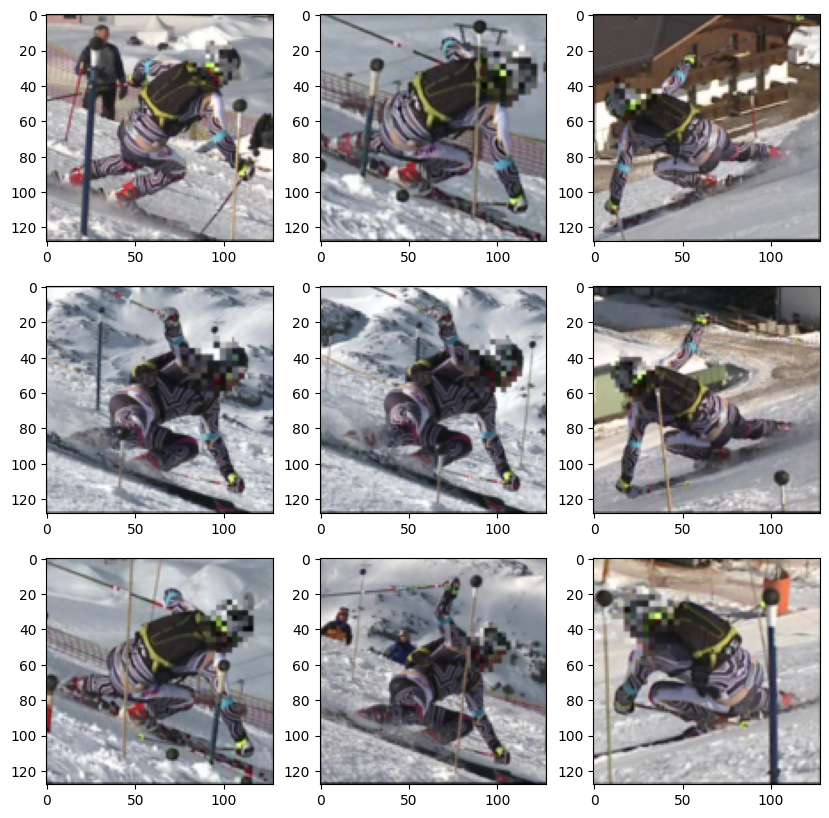

In [ ]:
plot_one_cluster(cluster_set, 2, labels_base)

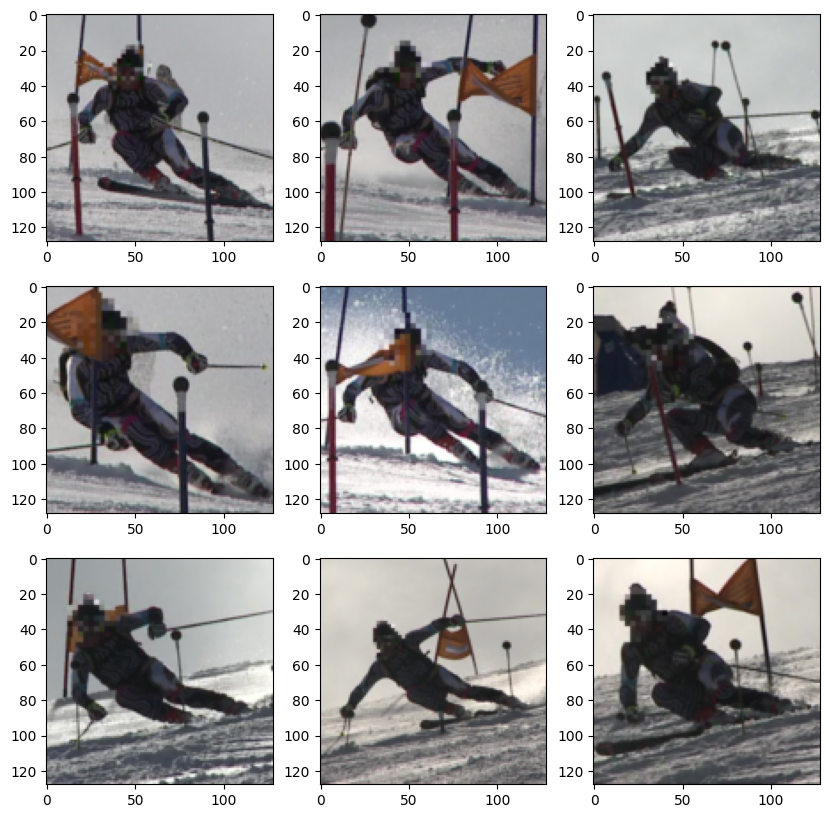

In [ ]:
plot_one_cluster(cluster_set, 3, labels_base)

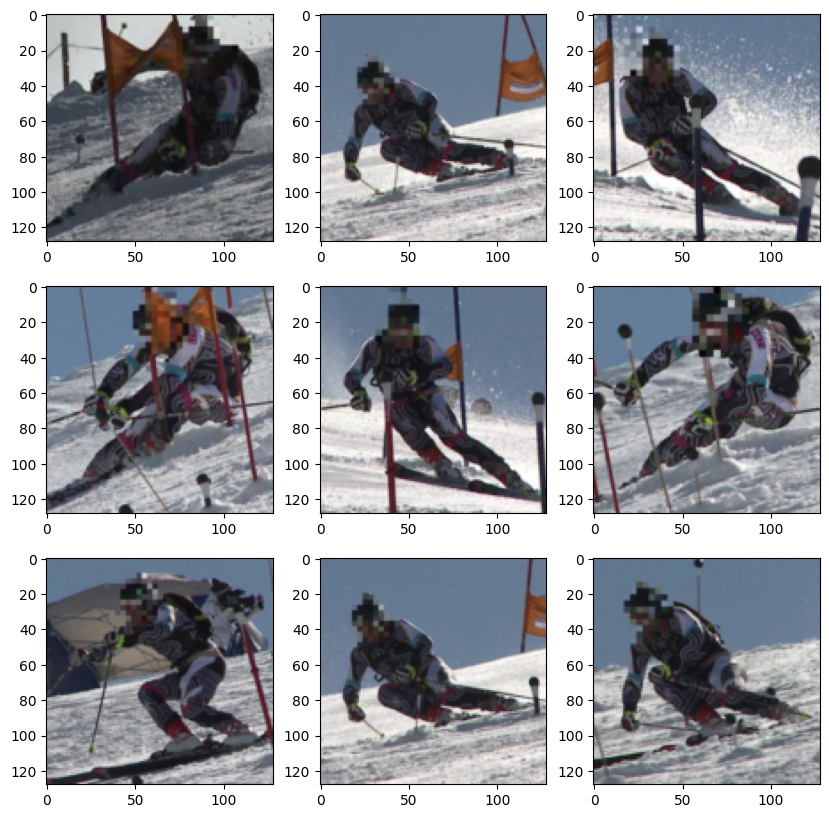

In [ ]:
plot_one_cluster(cluster_set, 4, labels_base)

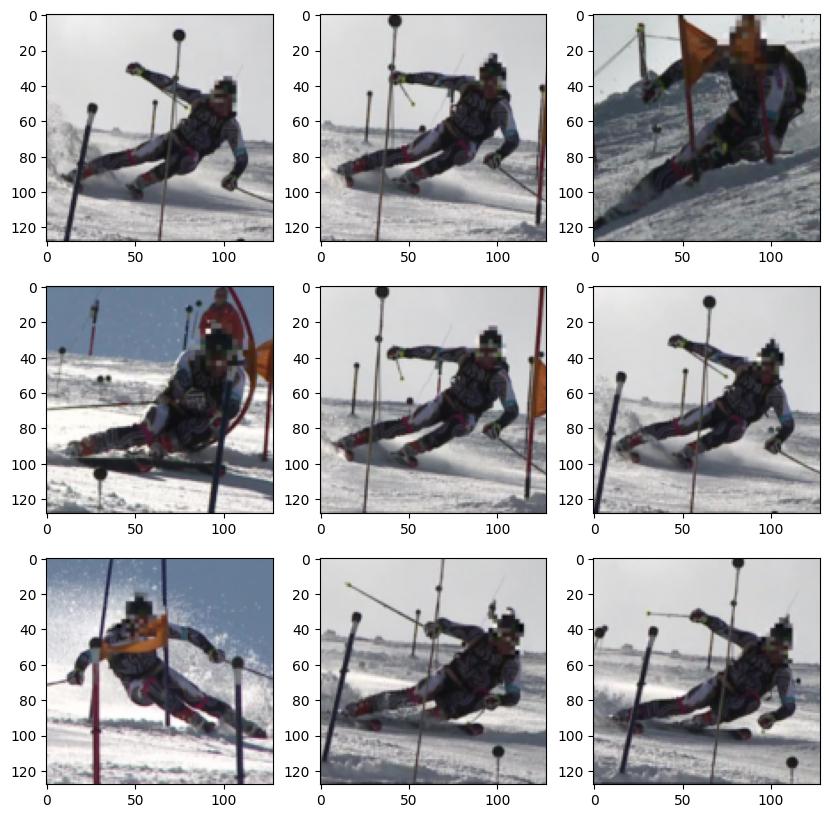

In [ ]:
plot_one_cluster(cluster_set, 5, labels_base)

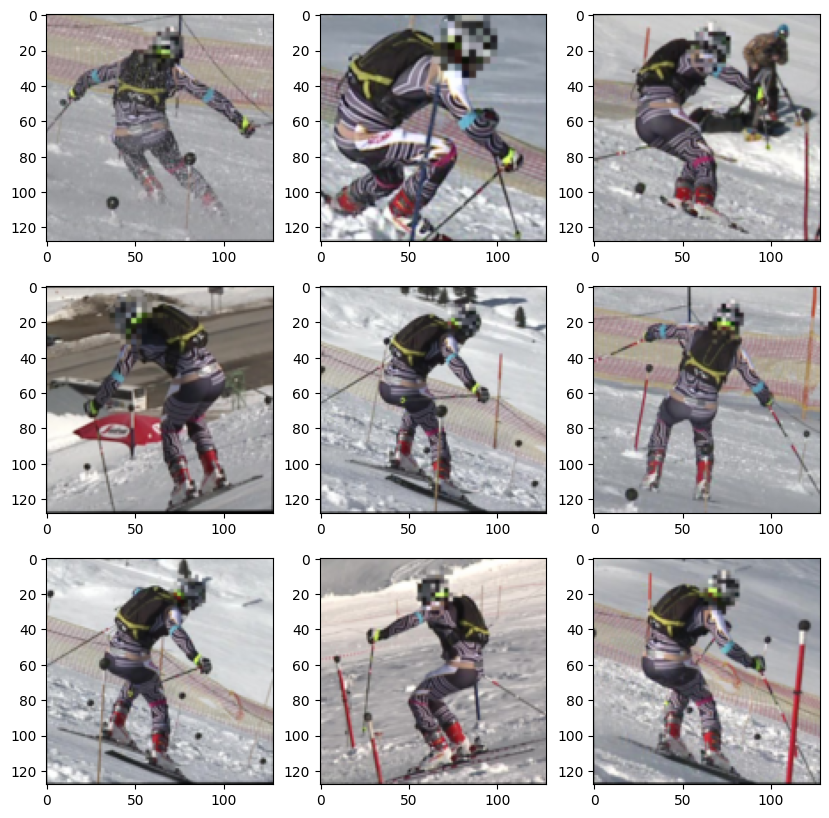

In [ ]:
plot_one_cluster(cluster_set, 6, labels_base)

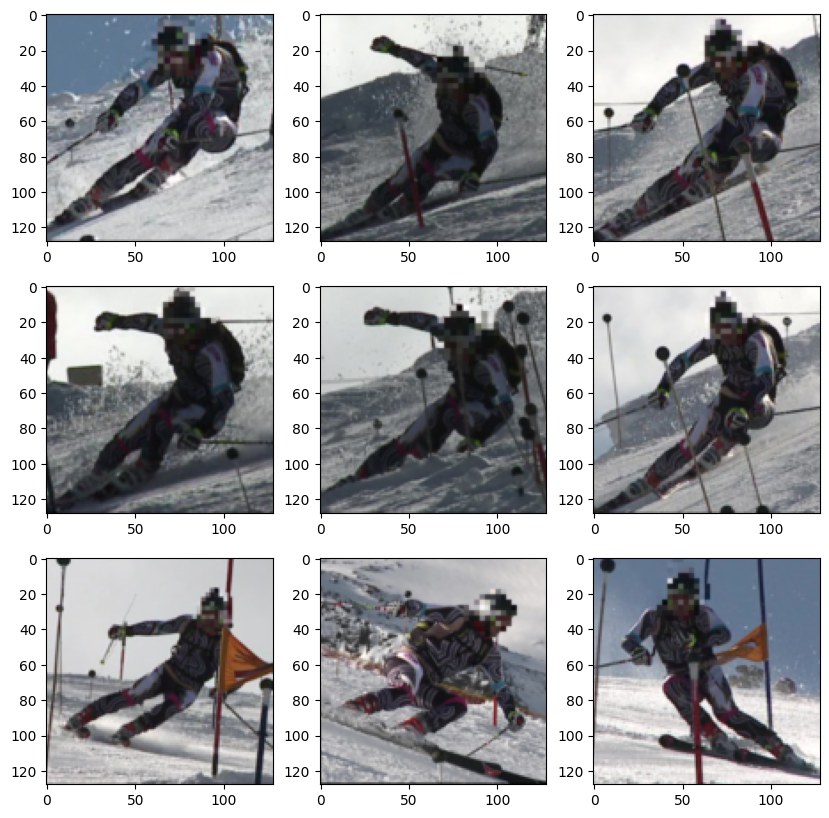

In [ ]:
plot_one_cluster(cluster_set, 7, labels_base)

#### Projection head
Clustering based on features extracted from projection head

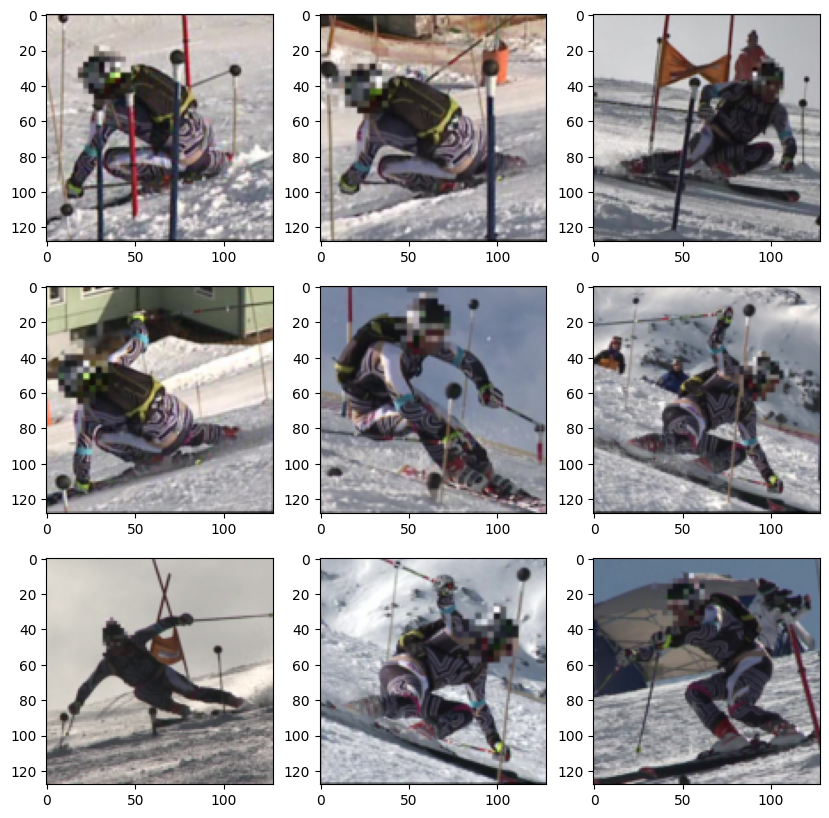

In [ ]:
plot_one_cluster(cluster_set, 0, labels_proj)

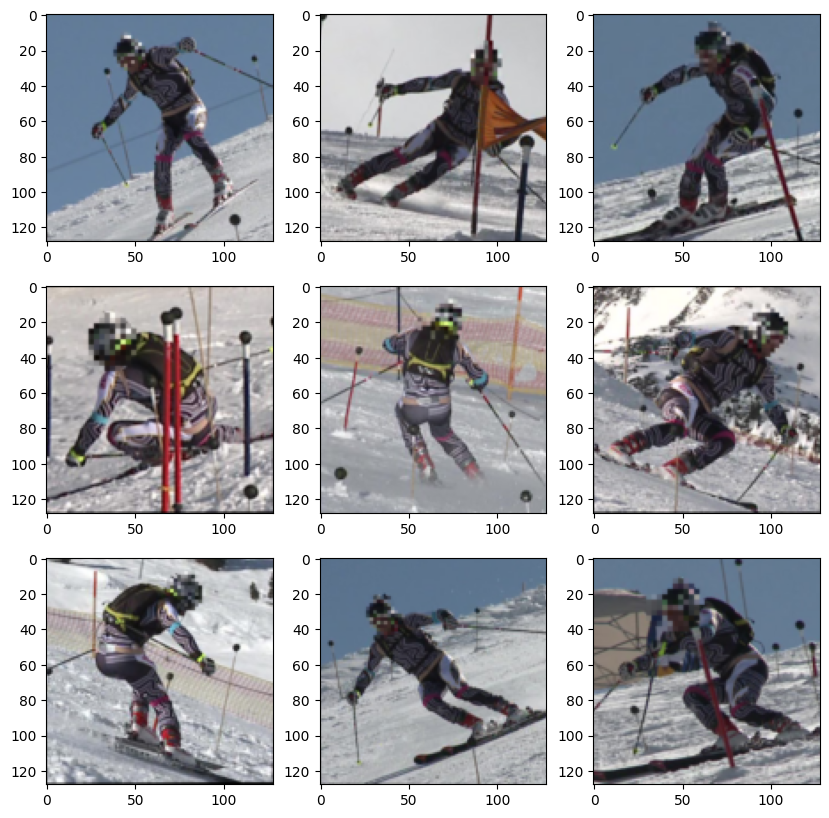

In [ ]:
plot_one_cluster(cluster_set, 1, labels_proj)

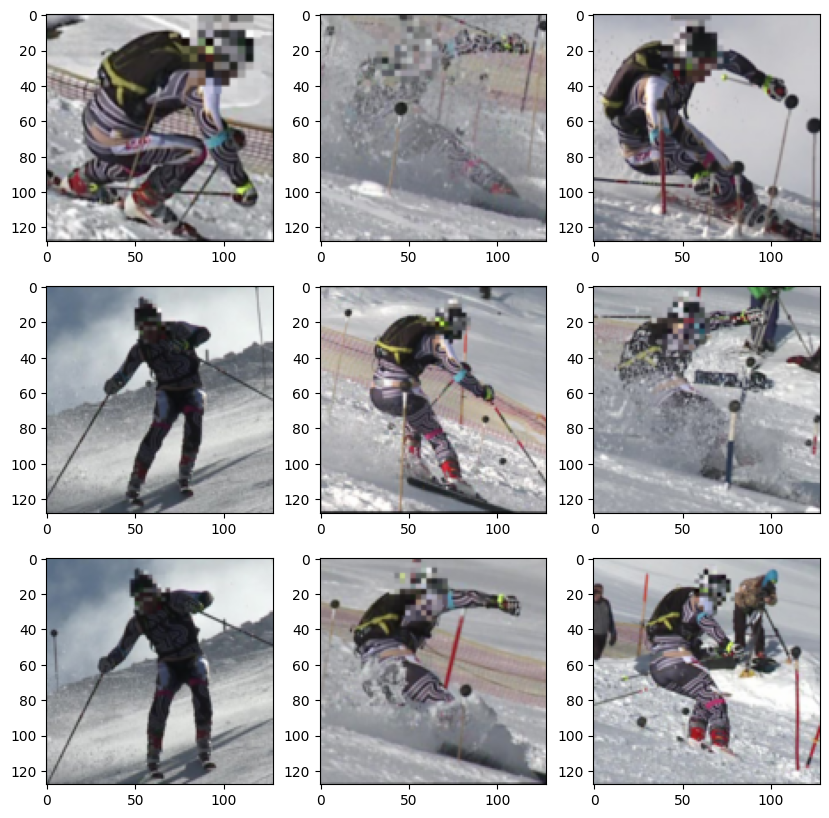

In [ ]:
plot_one_cluster(cluster_set, 2, labels_proj)

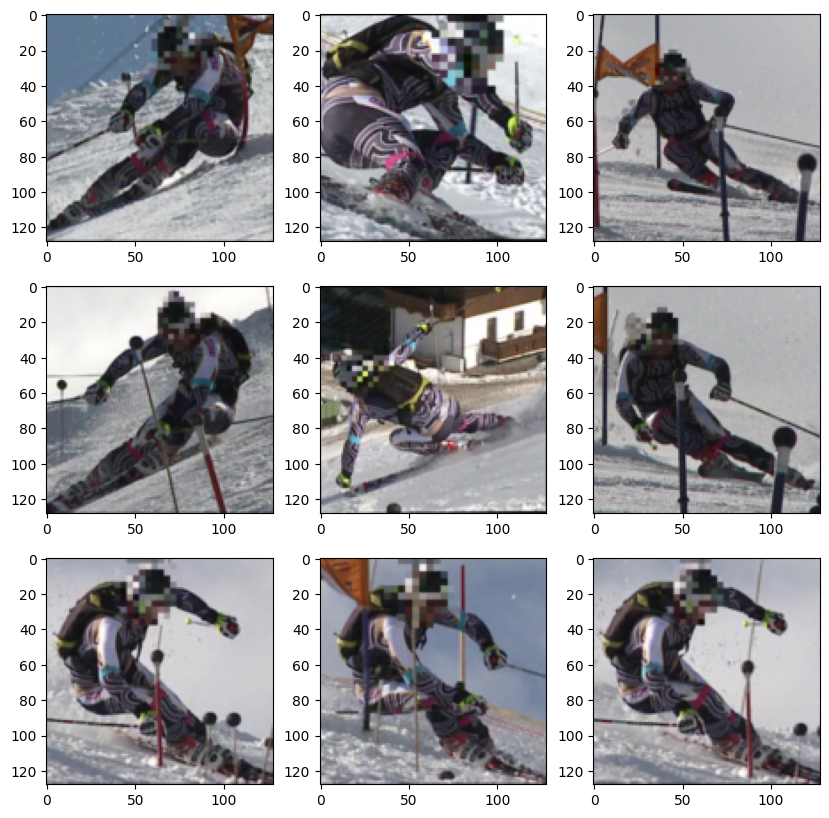

In [ ]:
plot_one_cluster(cluster_set, 3, labels_proj)

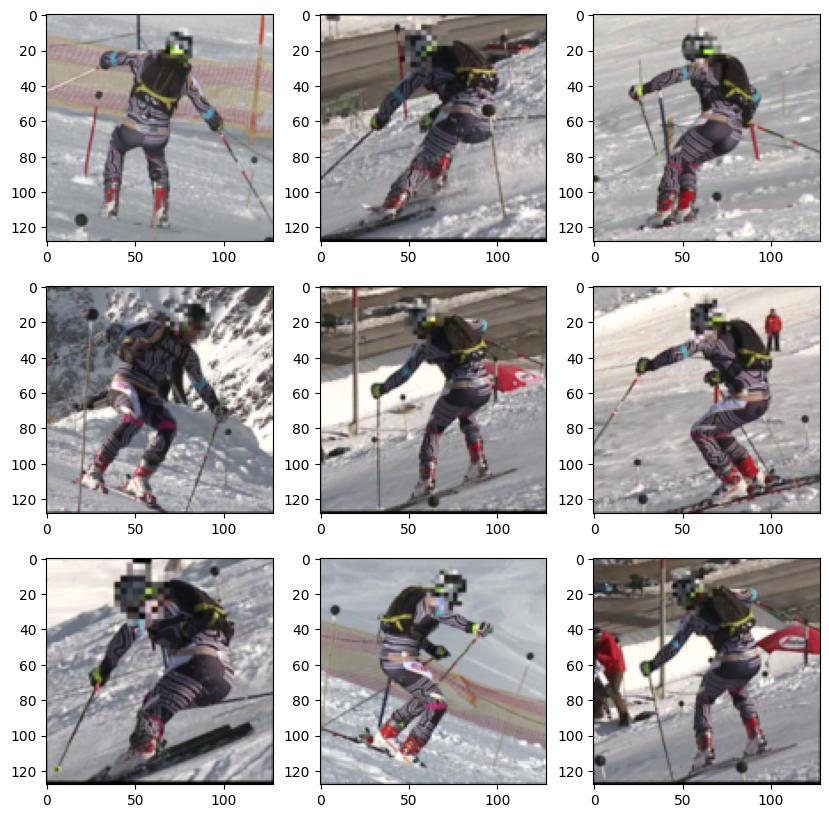

In [ ]:
plot_one_cluster(cluster_set, 4, labels_proj)

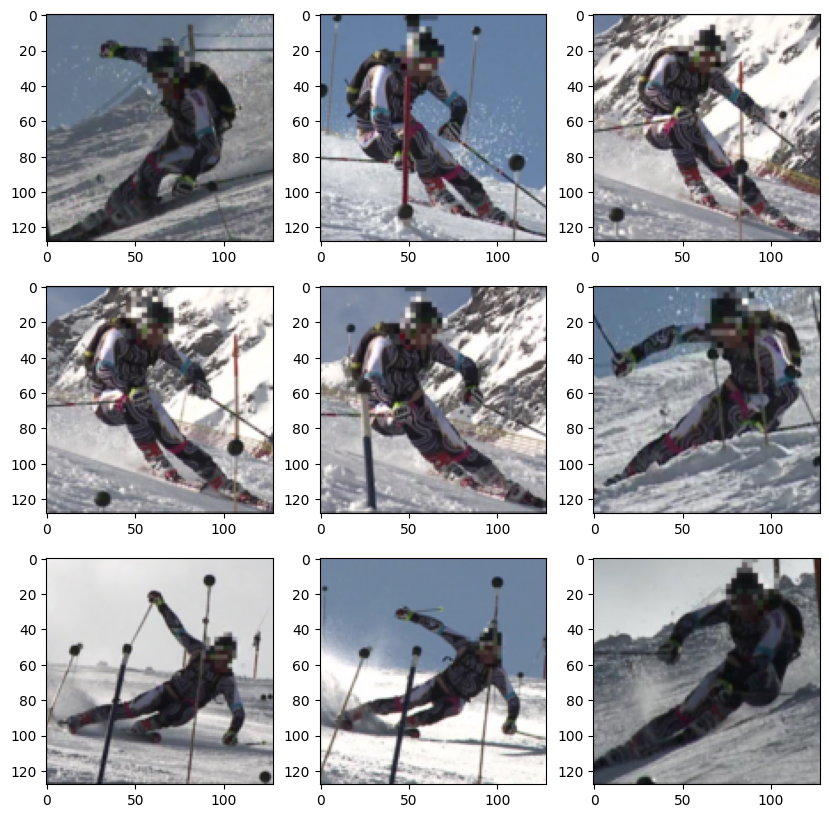

In [ ]:
plot_one_cluster(cluster_set, 5, labels_proj)

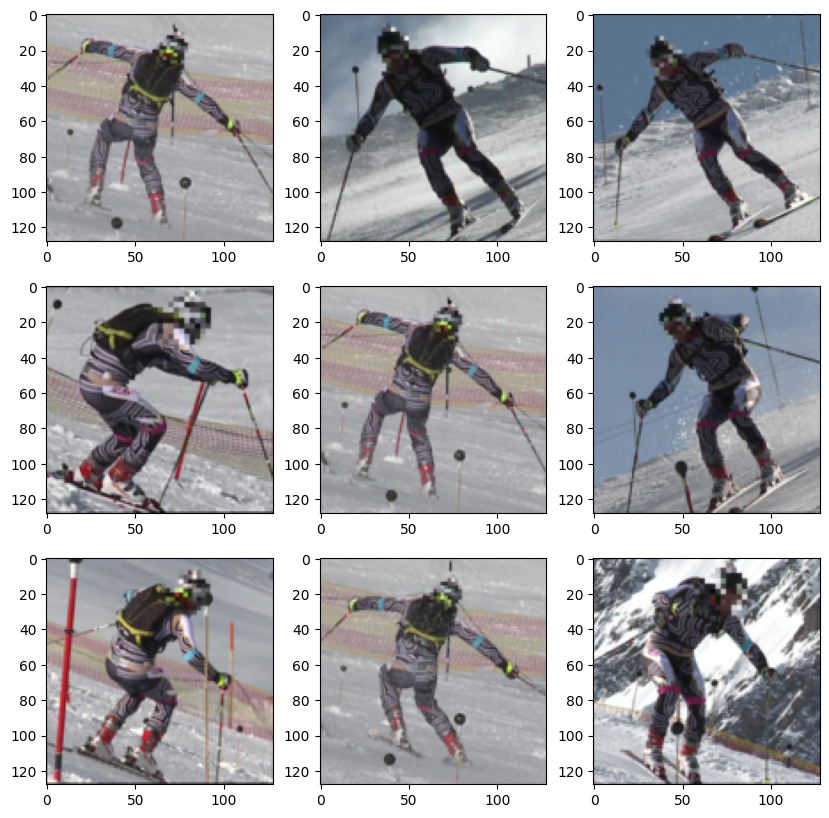

In [ ]:
plot_one_cluster(cluster_set, 6, labels_proj)

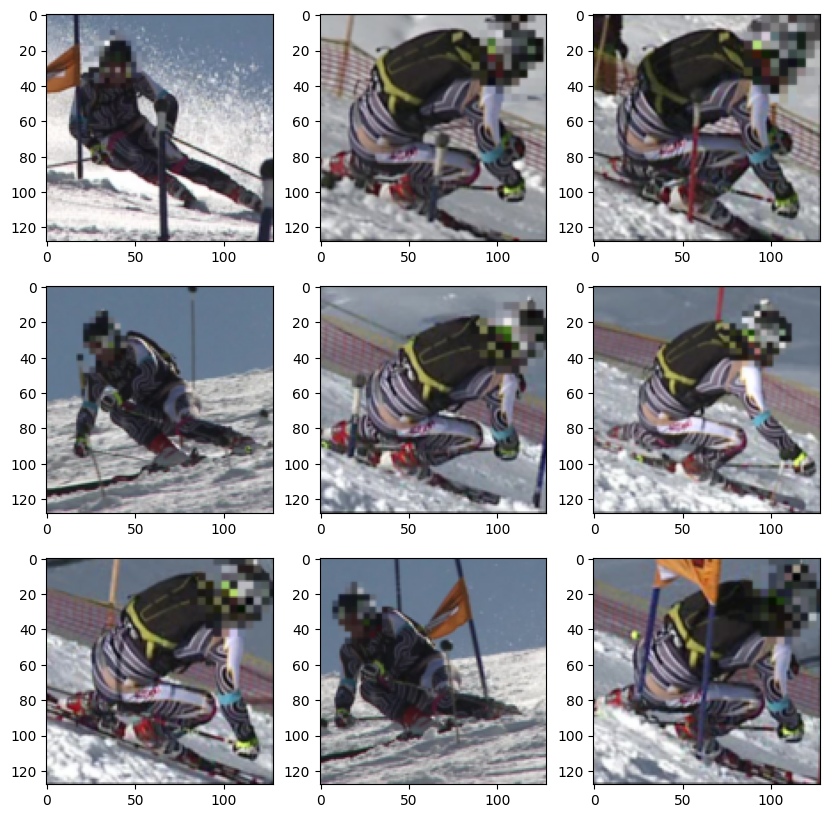

In [ ]:
plot_one_cluster(cluster_set, 7, labels_proj)